In [1]:
import arviz
import matplotlib.pyplot as plt
import pandas as pd
from utils.model import PresidentialElectionsModel
from utils.posteriorplots import predictive_plot, retrodictive_plot

In [2]:
arviz.style.use("arviz-darkgrid")
arviz.rcParams["plot.max_subplots"] = 50

In [3]:
%load_ext autoreload
%autoreload 2

## Model with socio-eco predictors

In [4]:
election_date = "2022-04-10"
mb = PresidentialElectionsModel(
    election_to_predict=election_date,
    test_cutoff=None,
    variance_weight=[0.1, 0.2, 0.2, 0.2, 0.1, 0.1, 0.1],
    lengthscale=[5, 14, 28, 42, 56, 70, 84],
)

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/algorithms.py:431: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  uniques = table.unique(values)
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/indexes/base.py:2023: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior.  In a future version these will be considered non-comparable.Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  return self._engine.is_unique
/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.9/site-packages/pandas/core/indexes/base.py:3512: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the 

In [5]:
hierarchical_dm = mb.build_model()

In [6]:
idata_hierarchical_dm = mb.sample_all(
    draws=2000,
    var_names=[
        "latent_popularity",
        "latent_pop_t0",
        "R",
        "noisy_popularity",
        "N_approve",
    ],
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_election_party_amplitude, lsd_party_effect_party_amplitude, lsd_intercept, unemployment_effect, house_election_effects_raw, house_election_effects_sd, house_effects, poll_bias, election_party_intercept, election_party_intercept_sd_party_effect, election_party_intercept_sd_intercept, party_intercept, party_intercept_sd]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1443 seconds.
The number of effective samples is smaller than 25% for some parameters.


In [101]:
arviz.to_netcdf(idata_hierarchical_dm, "../idata_hierarchical_dm.nc")

'idata_hierarchical_dm.nc'

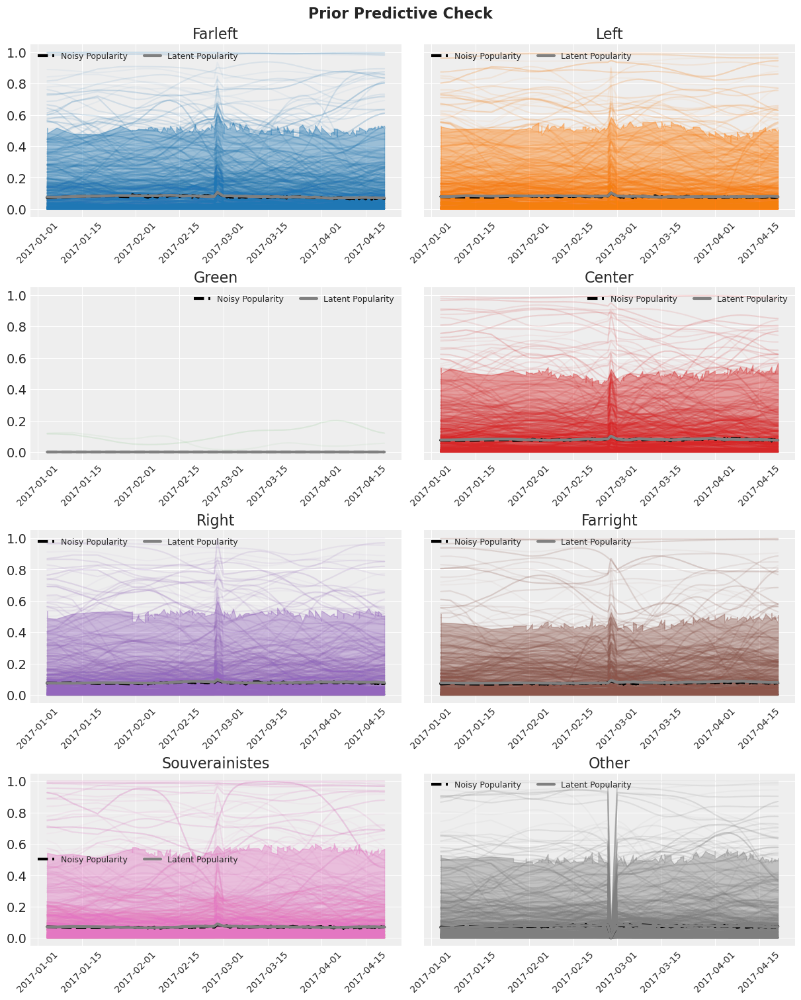

In [7]:
polls_train = mb.polls_train.copy()
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections="2017-04-23",
        observations=polls_train[polls_train.dateelection == "2017-04-23"].index,
    ),
    mb.parties_complete,
    polls_train[polls_train.dateelection == "2017-04-23"],
    group="prior",
)

In [8]:
election_forecast = mb.forecast_election(idata_hierarchical_dm)
results = mb.results_raw.copy()
polls_test = mb.polls_test.copy()

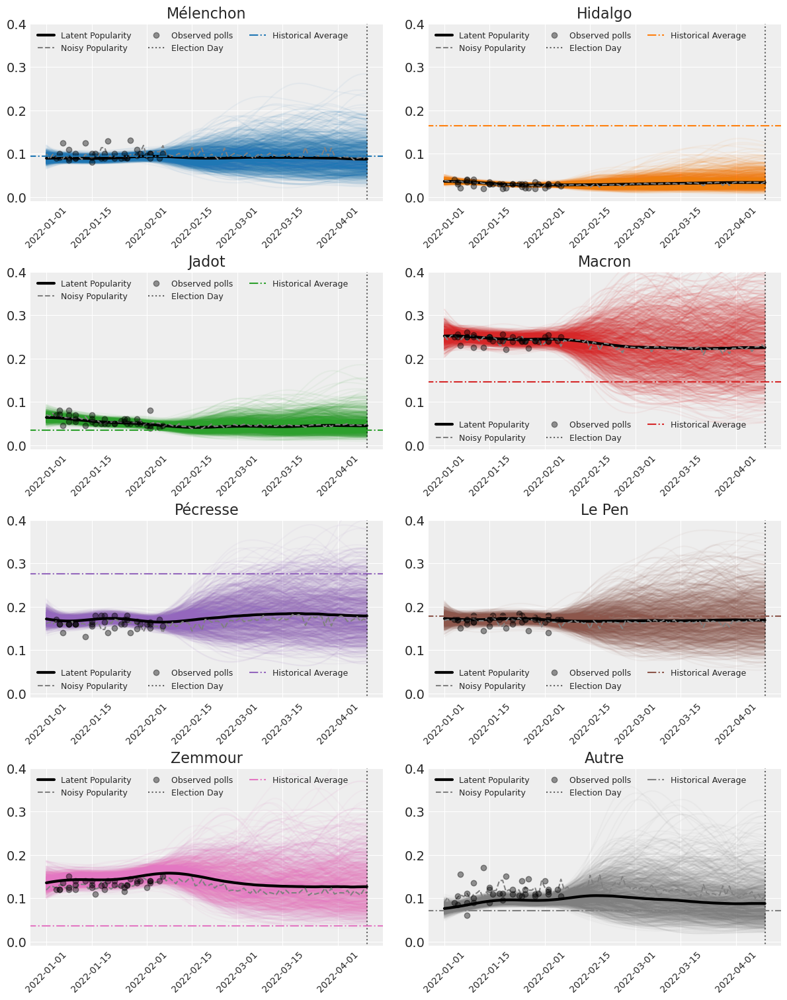

In [9]:
predictive_plot(
    idata=election_forecast,
    parties_complete=mb.parties_complete,
    election_date=election_date,
    polls_train=polls_train[polls_train.dateelection == election_date],
    polls_test=polls_test[polls_test.dateelection == election_date],
)

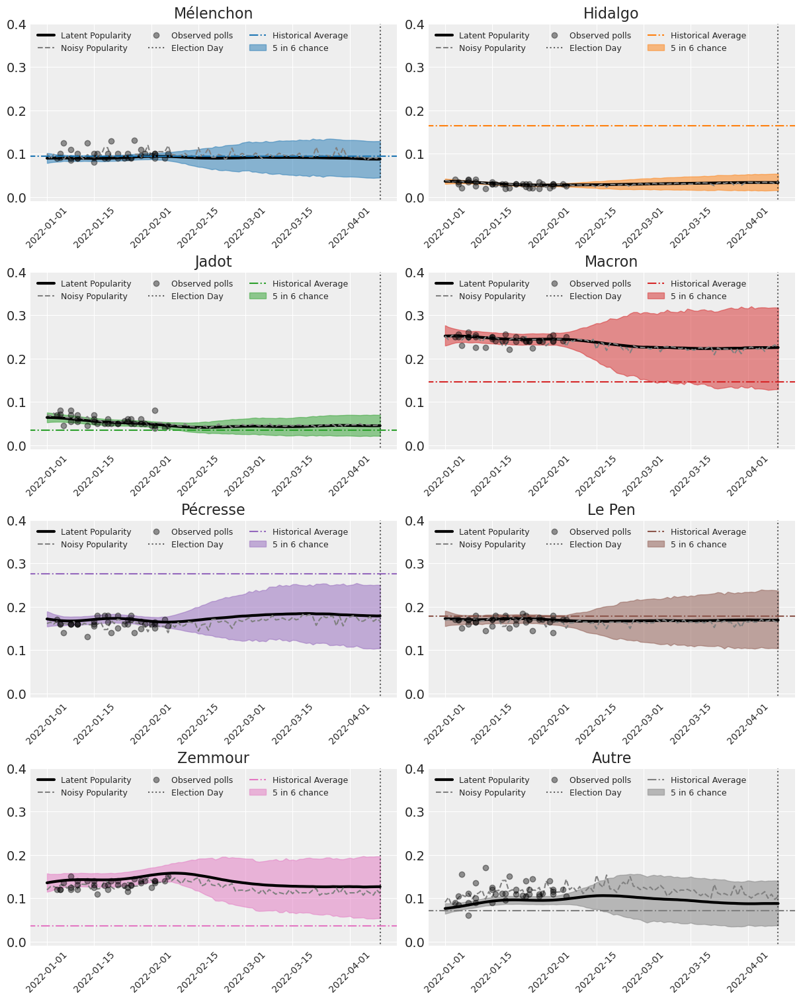

In [10]:
predictive_plot(
    idata=election_forecast,
    parties_complete=mb.parties_complete,
    election_date=election_date,
    polls_train=polls_train[polls_train.dateelection == election_date],
    polls_test=polls_test[polls_test.dateelection == election_date],
    hdi=True,
)

In [102]:
arviz.to_netcdf(election_forecast, "../election_forecast.nc")

'../election_forecast.nc'

In [11]:
summary = arviz.summary(idata_hierarchical_dm, round_to=2)
low_ess = summary[(summary.ess_bulk <= 1000) | (summary.ess_tail <= 1000)]

In [12]:
summary[(summary.ess_bulk <= 400) | (summary.ess_tail <= 400)]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat


In [13]:
low_ess[
    (~low_ess.index.str.startswith("noisy"))
    & (~low_ess.index.str.startswith("latent"))
    & (~low_ess.index.str.startswith("election_party_time_effect"))
]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat


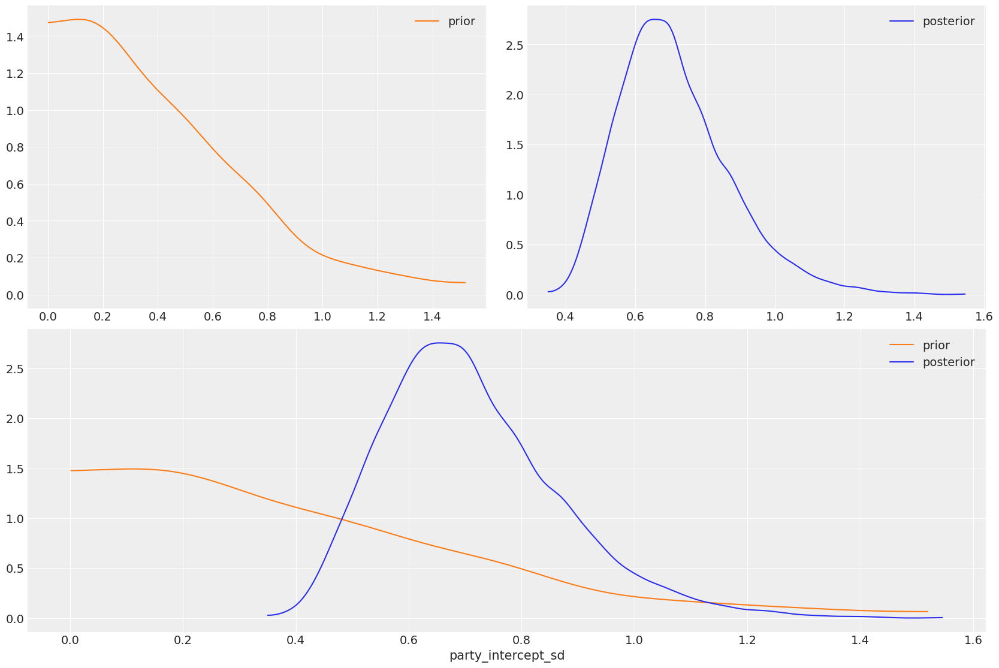

In [14]:
arviz.plot_dist_comparison(idata_hierarchical_dm, var_names="party_intercept_sd");

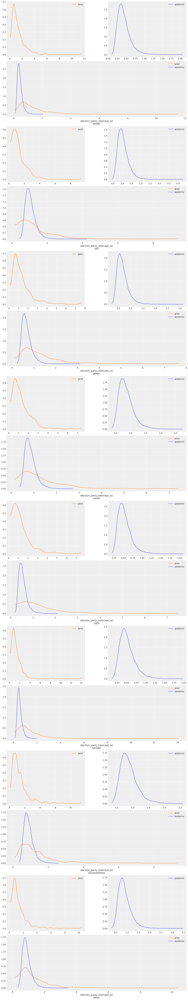

In [15]:
arviz.plot_dist_comparison(
    idata_hierarchical_dm, var_names="election_party_intercept_sd"
);

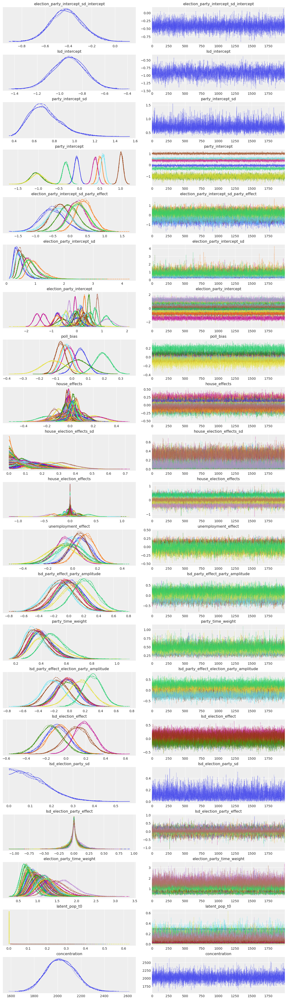

In [16]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

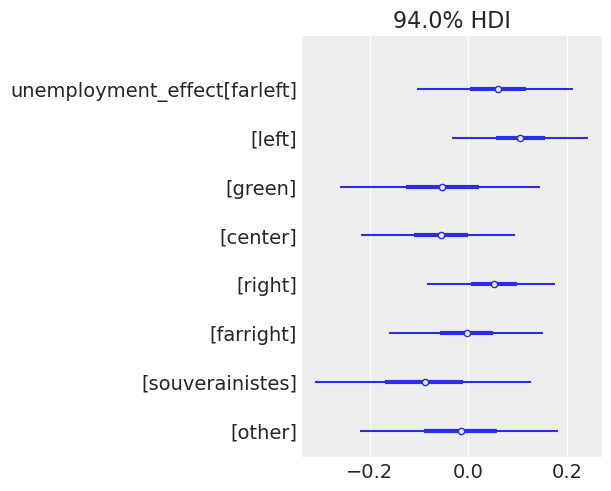

In [17]:
arviz.plot_forest(election_forecast, var_names="unemployment_effect", combined=True);

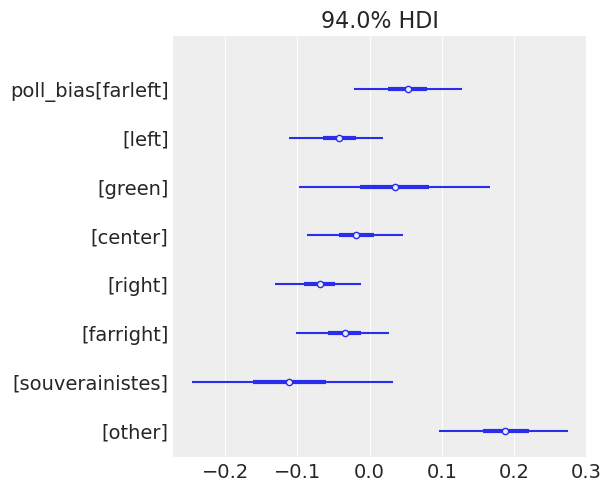

In [18]:
arviz.plot_forest(election_forecast, var_names="poll_bias", combined=True);

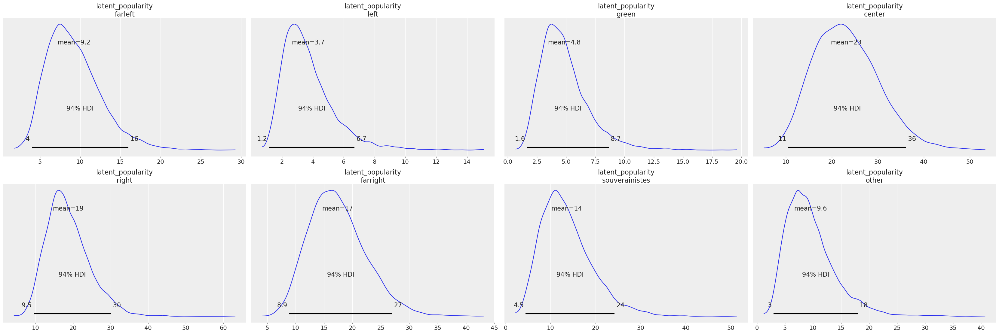

In [19]:
arviz.plot_posterior(
    election_forecast.predictions["latent_popularity"].sel(observations="2022-04-10")
    * 100,
);

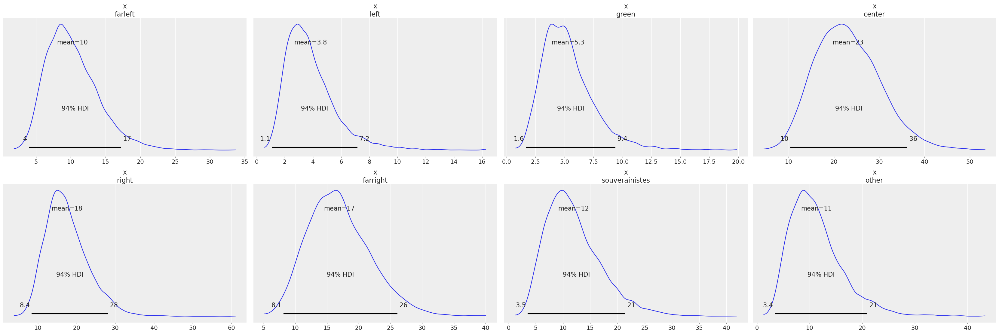

In [20]:
arviz.plot_posterior(
    (
        election_forecast.predictions["N_approve"]
        / election_forecast.predictions_constant_data["observed_N"]
    ).sel(observations="2022-04-10")
    * 100,
);

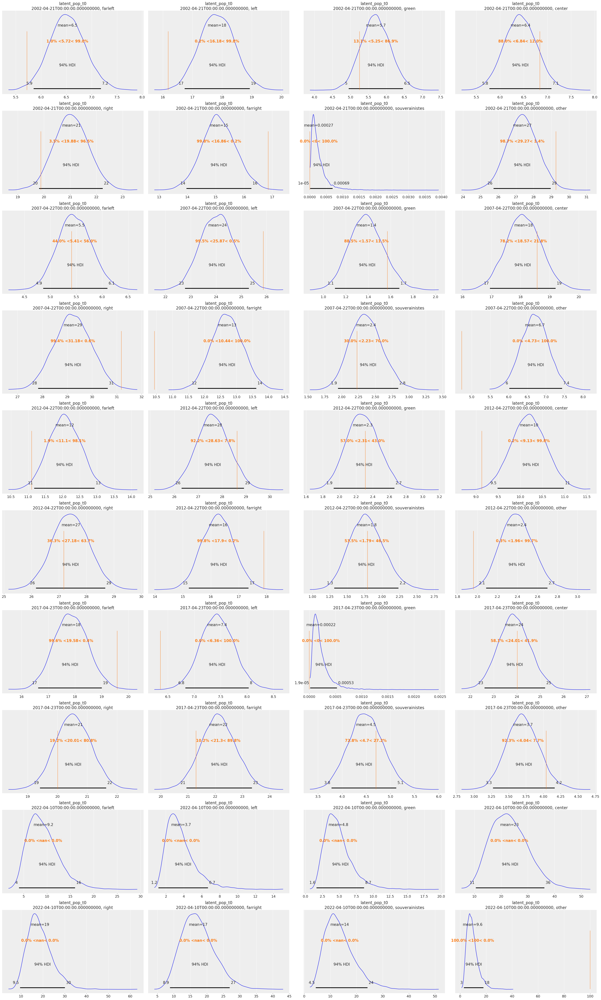

In [21]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

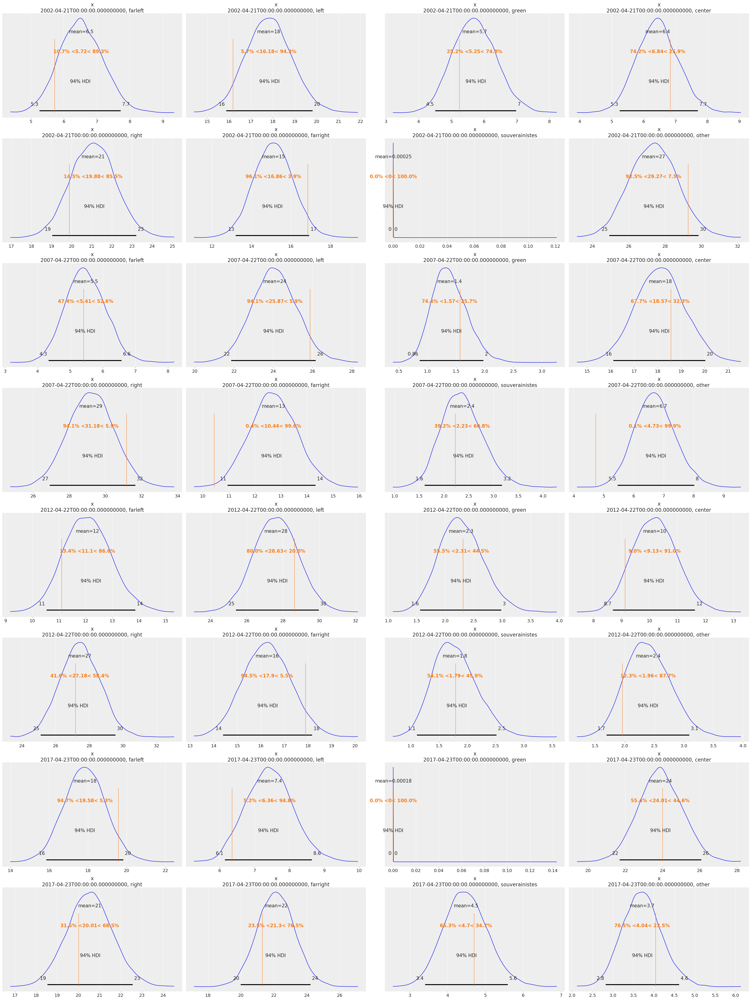

In [22]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

In [121]:
def ridgeplot(date: str, latent: bool = True, ridgeplot: bool = True):

    if latent:
        election_day = (
            election_forecast.predictions["latent_popularity"].sel(observations=date)
            * 100
        )
    else:
        election_day = (
            election_forecast.predictions["N_approve"]
            / election_forecast.predictions_constant_data["observed_N"]
        ).sel(observations=date) * 100

    election_day["parties_complete"] = [
        "Mélenchon",
        "Hidalgo",
        "Jadot",
        "Macron",
        "Pécresse",
        "Le Pen",
        "Zemmour",
        "Autre",
    ]
    election_day.name = "Forecast"

    if ridgeplot:
        ax = arviz.plot_forest(
            election_day,
            kind="ridgeplot",
            hdi_prob=0.83,
            ridgeplot_truncate=False,
            figsize=(7, 8),
            ridgeplot_quantiles=[0.25, 0.5, 0.75],
            ridgeplot_overlap=2.3,
            ridgeplot_alpha=0.8,
            ax=ax,
        )
    else:
        ax = arviz.plot_forest(election_day, kind="forestplot", hdi_prob=0.83, ax=ax)
    ax[0].axvline(10, ls="--", c="k", alpha=0.4)
    ax[0].axvline(20, ls="--", c="k", alpha=0.4)
    ax[0].axvline(30, ls="--", c="k", alpha=0.4)
    ax[0].axvline(40, ls="--", c="k", alpha=0.4)
    ax[0].set(title=f"Prévisions {date}", xlabel="% intentions exprimées", xlim=[0, 50])

    return

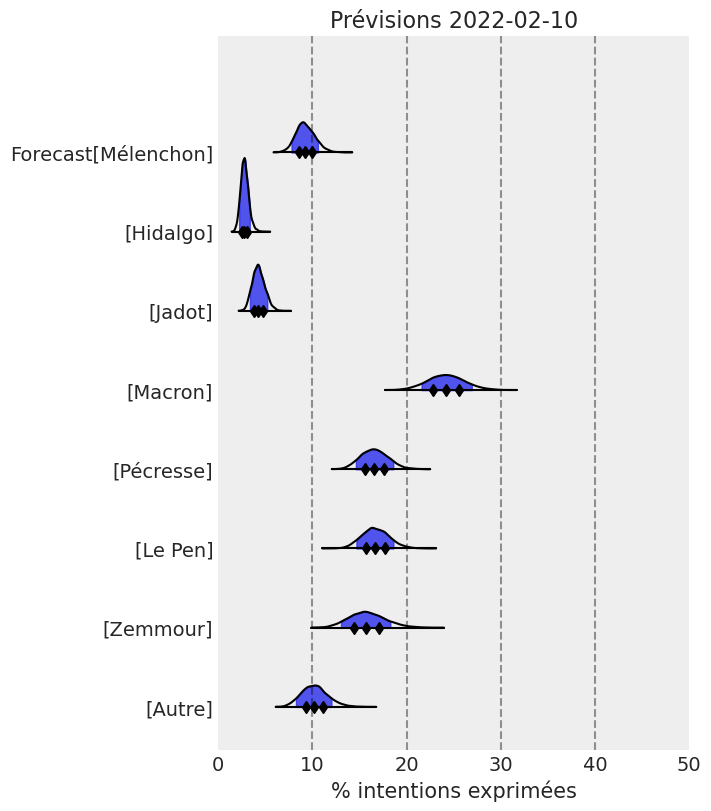

In [119]:
ridgeplot("2022-02-10", latent=True);

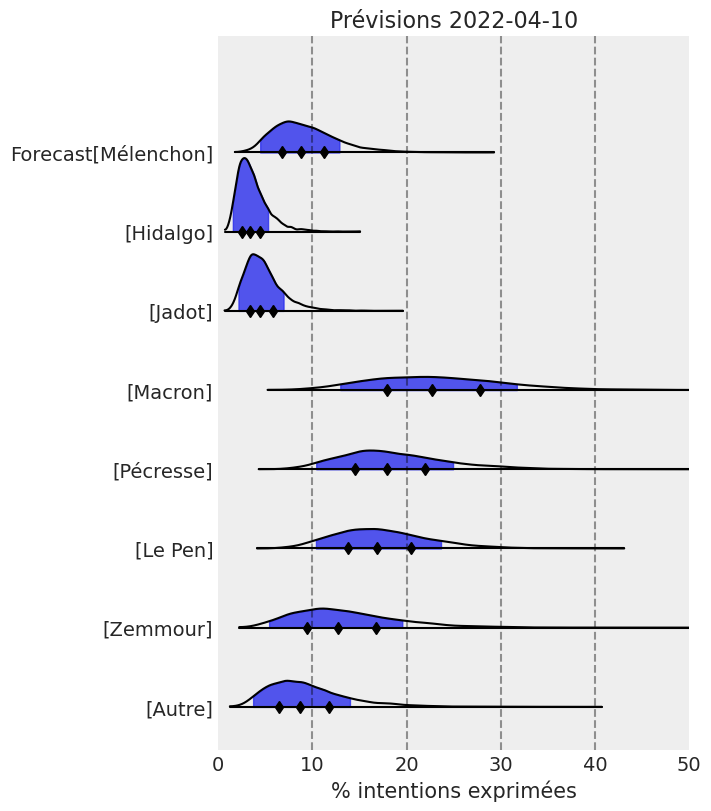

In [120]:
ridgeplot("2022-04-10", latent=True);

In [23]:
%load_ext watermark
%watermark -n -u -v -iv -a "Alexandre Andorra & Rémi Louf"

Author: Alexandre Andorra & Rémi Louf

Last updated: Thu Feb 10 2022

Python implementation: CPython
Python version       : 3.9.7
IPython version      : 7.28.0

pandas    : 1.3.4
arviz     : 0.11.4
matplotlib: 3.4.3

